# Basketball YOLOv5
Dataset obtained:

https://universe.roboflow.com/roboflow-universe-projects/basketball-players-fy4c2/dataset/25

Version YOLOv8 (Yv5 dataset was not downloaded so that the same dataset could be use during this training)

## Librerías iniciales

### Para limpiar el caché

#Para limpiar caché
!find . -name "*.pyc" -delete
!find . -name "__pycache__" -type d -exec rm -r {} +

### Importamos librerías

In [1]:
#Ultralytics update
!pip install -U ultralytics

In [2]:
import os
import random
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import cv2
from ultralytics import YOLO
from IPython.display import Video
import numpy as np  
import seaborn as sns
sns.set(style='darkgrid')
import pathlib
import glob
from tqdm.notebook import trange, tqdm
import warnings
warnings.filterwarnings('ignore')

In [3]:
#Estilo de gráficos a utilizar
sns.set(rc={'axes.facecolor': '#eae8fa'}, style='darkgrid')

## Plotting random train samples

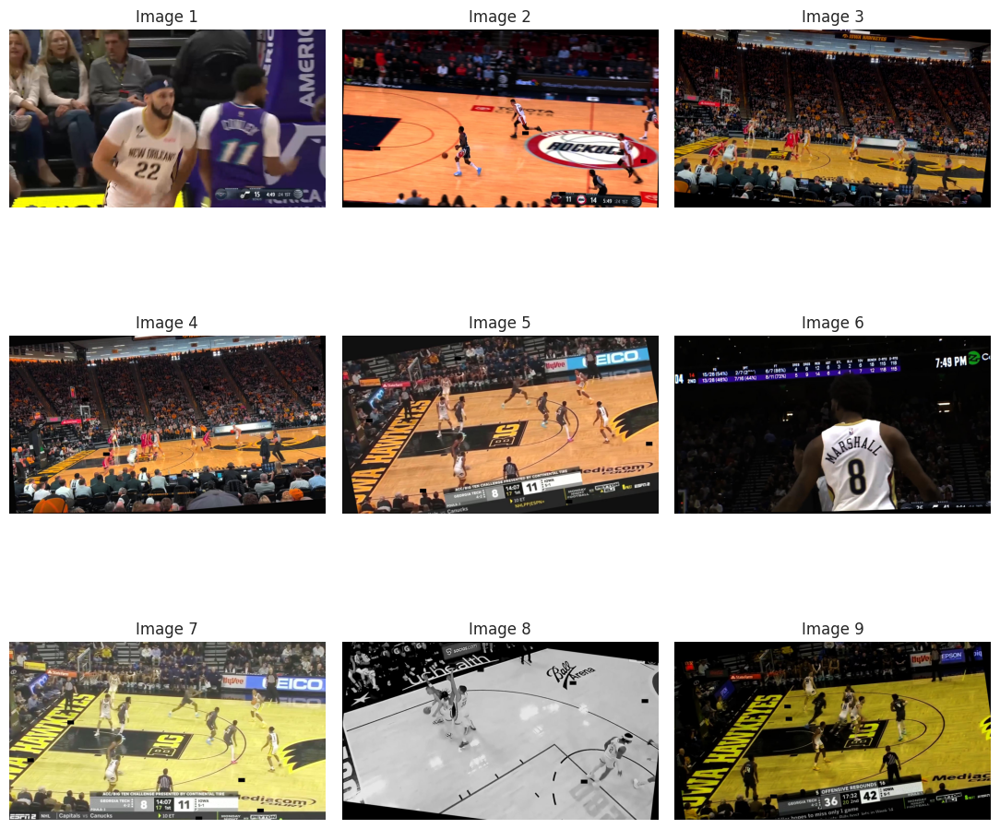

In [4]:
#Image directory for train samples
Image_dir = '/home/alide/Documentos/IA/Proyecto/BasketballYv8/train/images'

#To show samples
num_samples = 9
image_files = os.listdir(Image_dir)

# Randomly select num_samples images for plotting
rand_images = random.sample(image_files, num_samples)

fig, axes = plt.subplots(3, 3, figsize=(11, 11))

for i in range(num_samples):
    image = rand_images[i]
    ax = axes[i // 3, i % 3]
    ax.imshow(plt.imread(os.path.join(Image_dir, image)))
    ax.set_title(f'Image {i+1}')
    ax.axis('off')

plt.tight_layout()
plt.show()

## YOLOv5 Training

In [7]:
# Use a pretrained YOLOv5n model
model = YOLO("yolov5nu.pt") 


image 1/1 /home/alide/Documentos/IA/Proyecto/BasketballYv8/train/images/Iowa_Nebraska-2023-03-06-college-men_mp4-84_jpg.rf.d3516153709fa49b1393ee3247f290ba.jpg: 384x640 6 persons, 3 chairs, 117.4ms
Speed: 3.5ms preprocess, 117.4ms inference, 5.0ms postprocess per image at shape (1, 3, 384, 640)


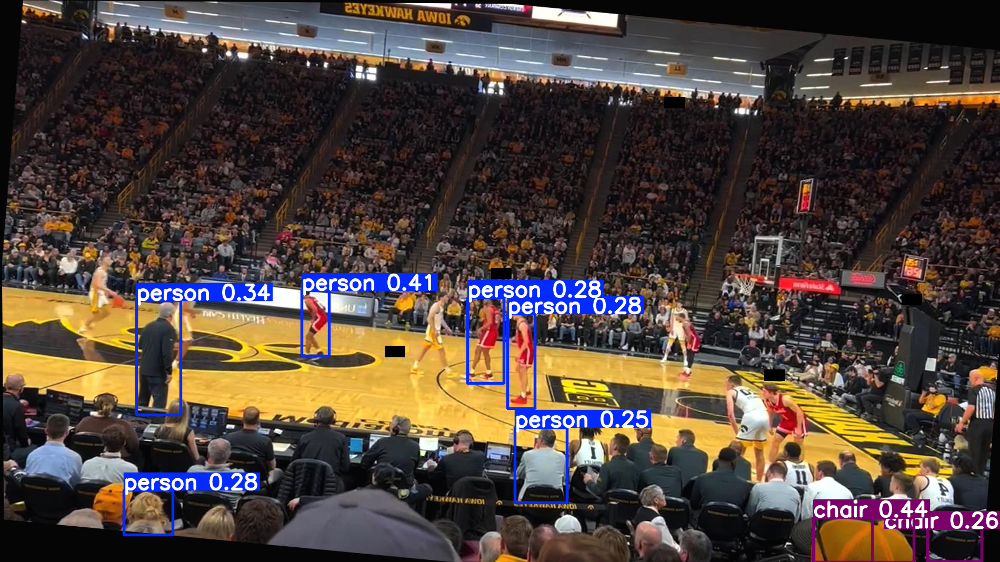

In [8]:
# Use the model to detect object
image = "/home/alide/Documentos/IA/Proyecto/BasketballYv8/train/images/Iowa_Nebraska-2023-03-06-college-men_mp4-84_jpg.rf.d3516153709fa49b1393ee3247f290ba.jpg"
result_predict = model.predict(source = image, imgsz=(640))

# show results
plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))

In [9]:
# Build from YAML and transfer weights
Training_model = YOLO('yolov5nu.pt')

In [10]:
#Training
Result_Training_model = Training_model.train(data="/home/alide/Documentos/IA/Proyecto/BasketballYv8/data.yaml",
                                             epochs = 10, batch = 4, optimizer = 'auto')

Ultralytics 8.3.103 🚀 Python-3.10.16 torch-2.6.0+cu124 CPU (AMD Ryzen 5 3500U with Radeon Vega Mobile Gfx)
engine/trainer: task=detect, mode=train, model=yolov5nu.pt, data=/home/alide/Documentos/IA/Proyecto/BasketballYv8/data.yaml, epochs=10, time=None, patience=100, batch=4, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save

train: Scanning /home/alide/Documentos/IA/Proyecto/BasketballYv8/train/labels.ca
val: Scanning /home/alide/Documentos/IA/Proyecto/BasketballYv8/valid/labels.cach

Plotting labels to runs/detect/train/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000769, momentum=0.9) with parameter groups 69 weight(decay=0.0), 76 weight(decay=0.0005), 75 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train
Starting training for 10 epochs...
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10         0G       1.78      2.567      1.355         57        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.506      0.285       0.25      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.226         44        640:  
       2/10         0G      1.559      1.539      1.216         44        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.621      0.337      0.379      0.199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.291         60        640:  
       3/10         0G      1.491      1.319      1.193         53        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.562      0.385      0.406      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.187         67        640:  
       4/10         0G      1.446       1.19      1.164         61        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.573      0.426      0.451      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.155         59        640:  
       5/10         0G      1.419      1.111      1.136         44        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.578      0.447      0.477      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment   1.11         64        640:  
       6/10         0G       1.33      1.018      1.101         78        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.691      0.426      0.492      0.282



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.088         57        640:  
       7/10         0G      1.293     0.9693      1.086         58        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.721      0.452      0.493      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.078         68        640:  
       8/10         0G      1.278     0.9413      1.075         56        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.604      0.459      0.496      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.079         73        640:  
       9/10         0G      1.244     0.9081      1.061         75        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.604      0.453      0.495      0.303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.047         52        640:  
      10/10         0G      1.211     0.8703      1.043         60        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.585      0.495      0.508      0.311



10 epochs completed in 1.068 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.103 🚀 Python-3.10.16 torch-2.6.0+cu124 CPU (AMD Ryzen 5 3500U with Radeon Vega Mobile Gfx)
YOLOv5n summary (fused): 84 layers, 2,504,699 parameters, 0 gradients, 7.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        100       1509      0.585      0.496      0.508      0.311
                  Ball         68         68      0.497     0.0588     0.0695     0.0334
                  Hoop         78         78      0.791       0.68      0.748      0.464
                Period         67         68      0.426      0.118      0.182     0.0922
                Player         99        762      0.794      0.869      0.886      0.534
                   Ref         86        189      0.731      0.847      0.872      0.558
            Shot Clock         46         46      0.593      0.254      0.284      0.152
             Team Name         38         76      0.402      0.433      0.389      0.214
           Team Points         80        161      0.608      0.826      0.741      0.495
        Time Remaining         61         61       0.42      0.377      0.403      0.254
Speed: 1.3ms preprocess, 61.9ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detec

## Post-training Results

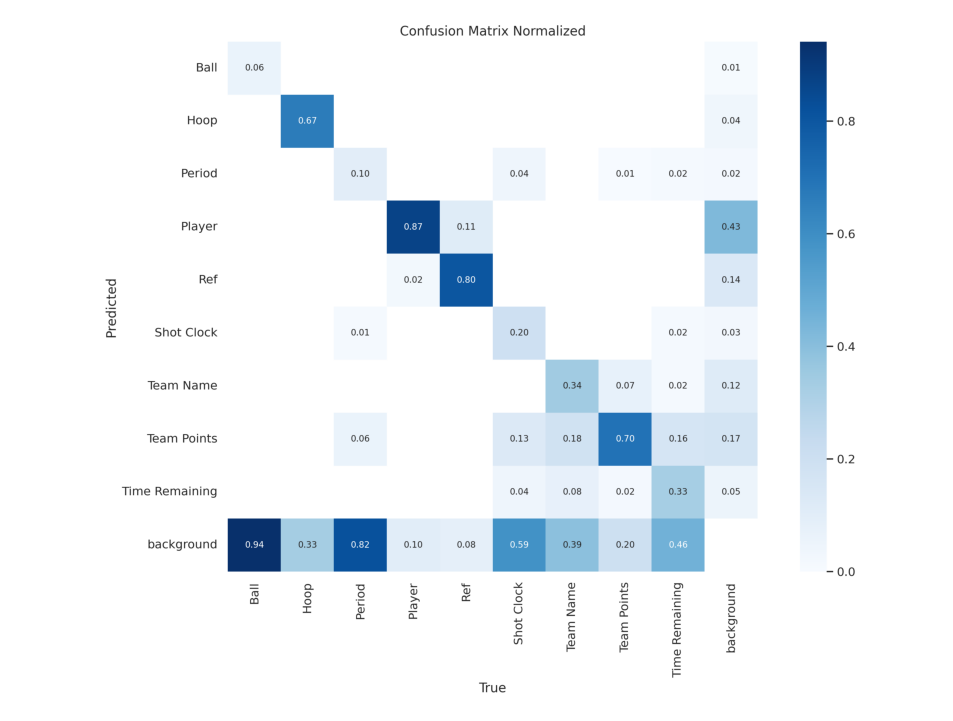

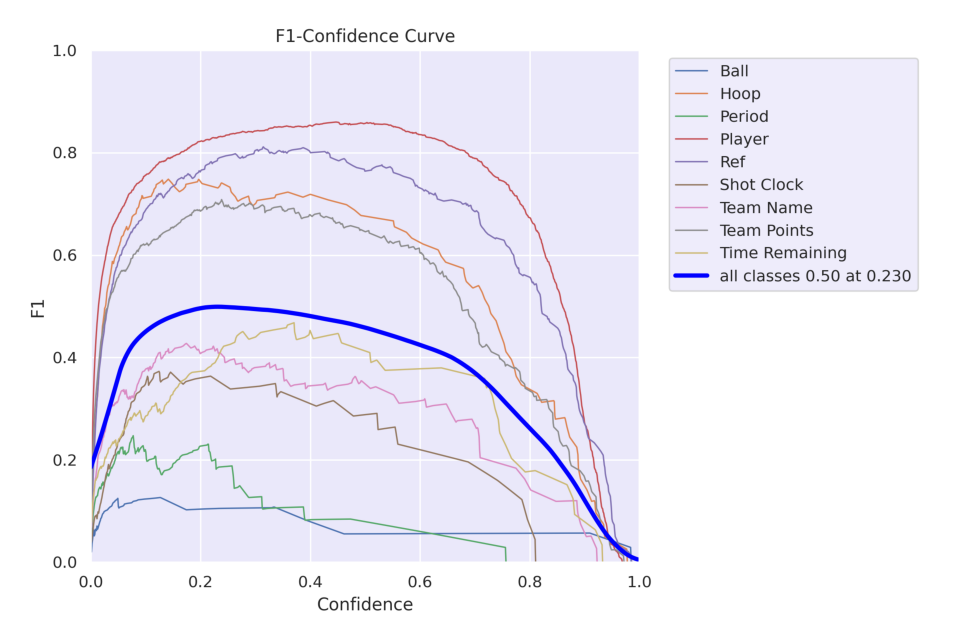

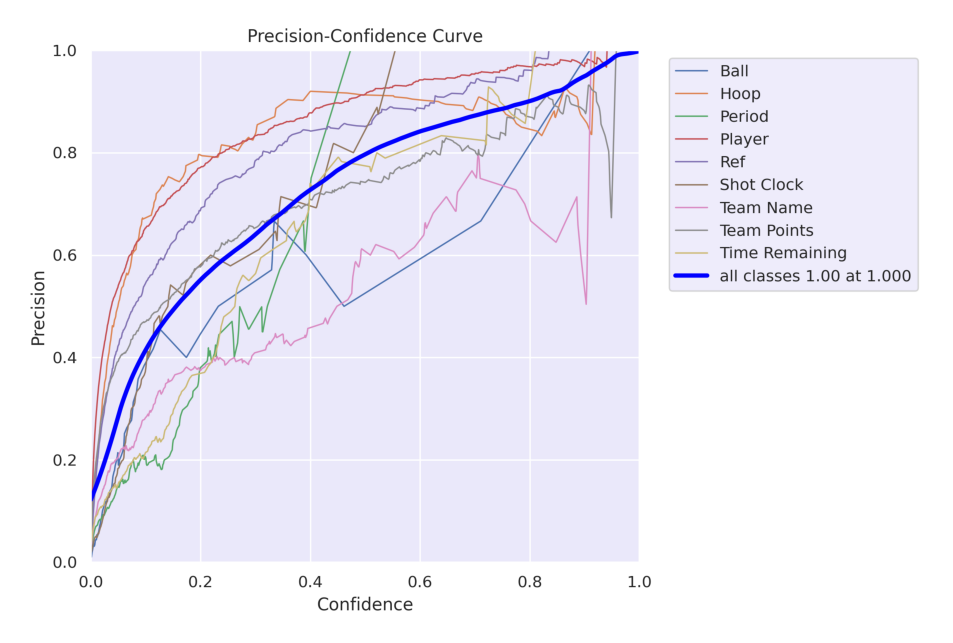

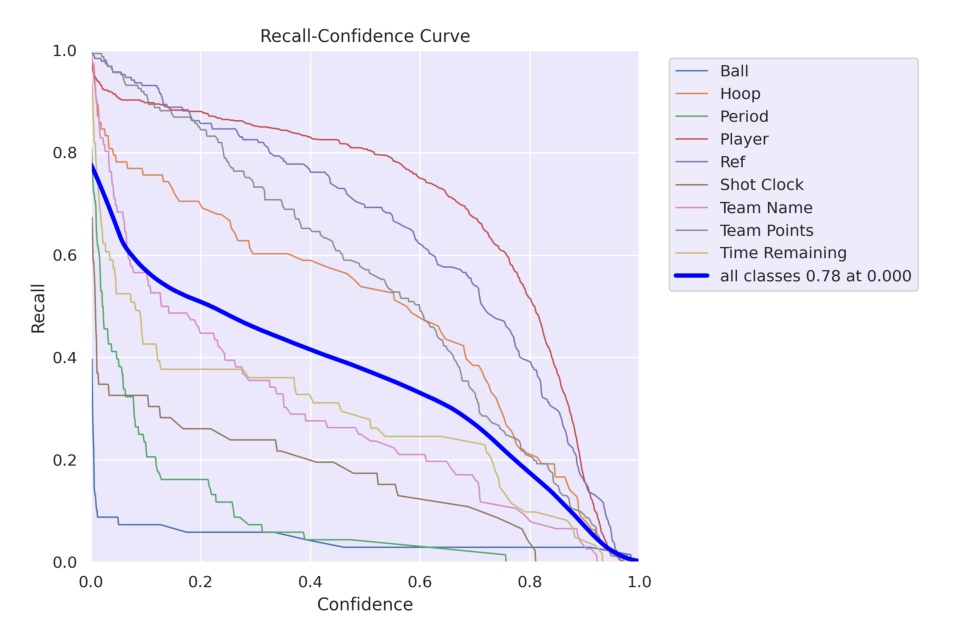

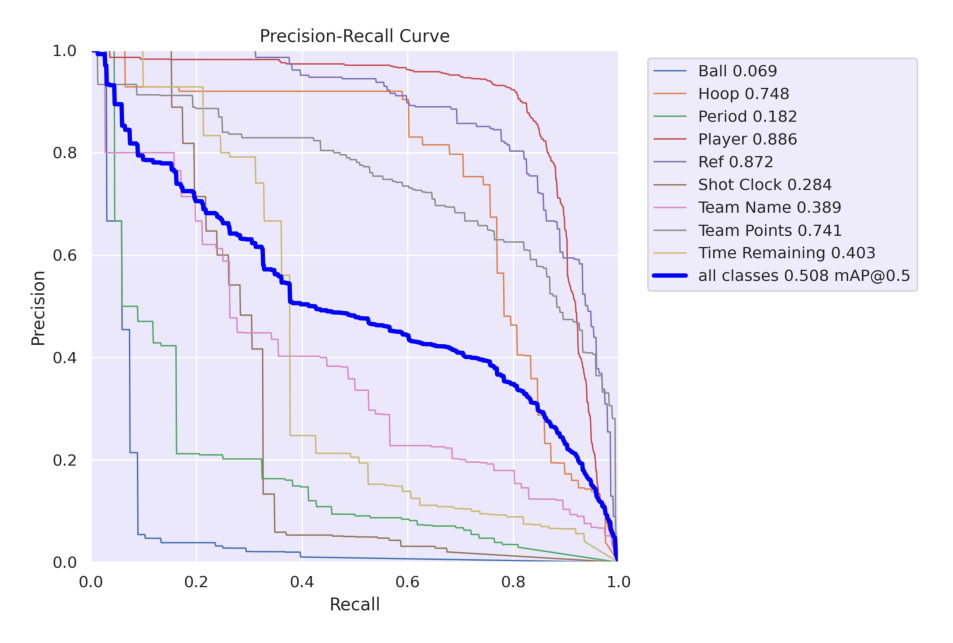

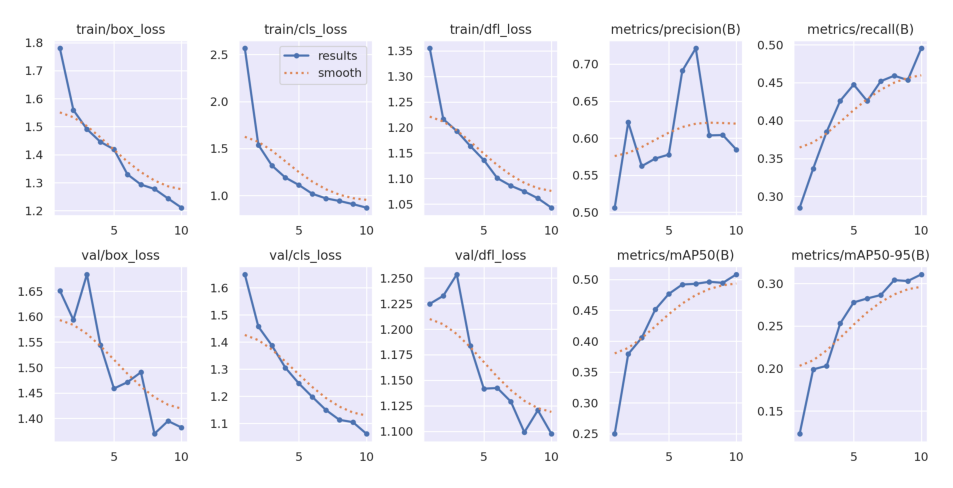

In [11]:
#Function for showing results
def display_images(post_training_files_path, image_files):

    for image_file in image_files:
        image_path = os.path.join(post_training_files_path, image_file)
        img = cv2.imread(image_path)
        if img is None:
            print(f"❌ Could not read image: {image_path}")
            continue
        
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        plt.figure(figsize=(10, 10), dpi=120)
        plt.imshow(img)
        plt.axis('off')
        plt.show()

# List of image files to display
image_files = [
    'confusion_matrix_normalized.png',
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png',
    'PR_curve.png',
    'results.png'
]

# Path to the directory containing the images
post_training_files_path = '/home/alide/Documentos/IA/Proyecto/runs/detect/train'

# Display the images
display_images(post_training_files_path, image_files)

## Best performing model and example

In [12]:
# Loading the best performing model
Final_model = YOLO('/home/alide/Documentos/IA/Proyecto/runs/detect/train/weights/best.pt')

# Evaluating the model on the validset
metrics = Final_model.val(split = 'val')

# final results 
print("precision(B): ", metrics.results_dict["metrics/precision(B)"])
print("metrics/recall(B): ", metrics.results_dict["metrics/recall(B)"])
print("metrics/mAP50(B): ", metrics.results_dict["metrics/mAP50(B)"])
print("metrics/mAP50-95(B): ", metrics.results_dict["metrics/mAP50-95(B)"])

Ultralytics 8.3.103 🚀 Python-3.10.16 torch-2.6.0+cu124 CPU (AMD Ryzen 5 3500U with Radeon Vega Mobile Gfx)
YOLOv5n summary (fused): 84 layers, 2,504,699 parameters, 0 gradients, 7.1 GFLOPs


val: Scanning /home/alide/Documentos/IA/Proyecto/BasketballYv8/valid/labels.cach
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        100       1509      0.585      0.496      0.508      0.311
                  Ball         68         68      0.497     0.0588     0.0695     0.0334
                  Hoop         78         78      0.791       0.68      0.748      0.464
                Period         67         68      0.426      0.118      0.182     0.0922
                Player         99        762      0.794      0.869      0.886      0.534
                   Ref         86        189      0.731      0.847      0.872      0.558
            Shot Clock         46         46      0.593      0.254      0.284      0.152
             Team Name         38         76      0.402      0.433      0.389      0.214
           Team Points         80        161      0.608      0.826      0.741      0.495
        Time Remaining         61         61       0.42      0.377      0.403      0.254
Speed: 1.0ms preprocess, 57.4ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs/detec

### Exporting the model

In [13]:
#Install dependencies
!pip install onnx
!pip install onnxruntime

In [14]:
#Export the model
Final_model.export(format='onnx')

Ultralytics 8.3.103 🚀 Python-3.10.16 torch-2.6.0+cu124 CPU (AMD Ryzen 5 3500U with Radeon Vega Mobile Gfx)

PyTorch: starting from '/home/alide/Documentos/IA/Proyecto/runs/detect/train/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 13, 8400) (5.0 MB)
requirements: Ultralytics requirement ['onnxslim'] not found, attempting AutoUpdate...
requirements: ❌ AutoUpdate skipped (offline)

ONNX: starting export with onnx 1.17.0 opset 19...
ONNX: simplifier failure: No module named 'onnxslim'
ONNX: export success ✅ 0.7s, saved as '/home/alide/Documentos/IA/Proyecto/runs/detect/train/weights/best.onnx' (9.8 MB)

Export complete (1.0s)
Results saved to /home/alide/Documentos/IA/Proyecto/runs/detect/train/weights
Predict:         yolo predict task=detect model=/home/alide/Documentos/IA/Proyecto/runs/detect/train/weights/best.onnx imgsz=640  
Validate:        yolo val task=detect model=/home/alide/Documentos/IA/Proyecto/runs/detect/train/weights/best.onnx imgsz=640 d

'/home/alide/Documentos/IA/Proyecto/runs/detect/train/weights/best.onnx'

### Example using Final_Model with the same img used with the pre trained model


image 1/1 /home/alide/Documentos/IA/Proyecto/BasketballYv8/train/images/Iowa_Nebraska-2023-03-06-college-men_mp4-84_jpg.rf.d3516153709fa49b1393ee3247f290ba.jpg: 384x640 13 Players, 2 Refs, 87.2ms
Speed: 6.4ms preprocess, 87.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


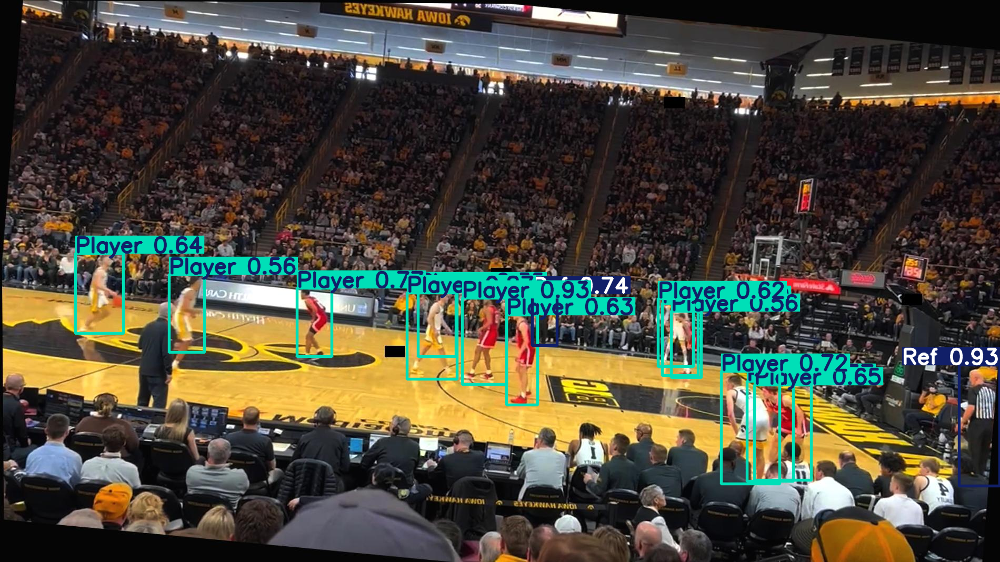

In [15]:
image = "/home/alide/Documentos/IA/Proyecto/BasketballYv8/train/images/Iowa_Nebraska-2023-03-06-college-men_mp4-84_jpg.rf.d3516153709fa49b1393ee3247f290ba.jpg"
result_predict = Final_model.predict(source = image, imgsz=(640))

# show results
plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))

## FInal Model architecture

In [16]:
Final_model

YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 16, kernel_size=(6, 6), stride=(2, 2), padding=(2, 2))
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (act): SiLU(inplace=True)
      )
      (2): C3(
        (cv1): Conv(
          (conv): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1))
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1))
          (act): SiLU(inplace=True)
        )
        (cv3): Conv(
          (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
          (act): SiLU(inplace=True)
        )
        (m): Sequential(
          (0): Bottleneck(
            (cv1): Conv(
              (conv): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1))
              (act): SiLU(inplace=True)
            )
            (cv2): Conv(
             